<center> <h1> **Fraud Detection**</h1> <br>
<h2>
This is a simulated credit card transaction dataset created by an A.I. that has legitimate and fraudulent transactions during the span of *1st Jan 2019 - 31st Dec 2020.* <br> It contains the records of credit card purchases of 1000 customers doing transactions spanning from 800 different merchants. 	</h2></center>
<p>
1. trans_date_trans_time<br>
2. cc_num<br>
3. merchant<br>
4. category<br>
5. amt<br>
6. first last (name)<br>
7. gender<br>
8. zip<br>
9.	lat(latitude)	<br>
10. long(longitude)	<br>
11. city_pop<br>
12.	job	<br>
13. dob(date of birth)<br>	
14. trans_num(transaction number)<br>	
15. unix_time	<br>
16. merch_lat	<br>
17. merch_long	<br>
18. is_fraud<br>
</p>
<center><h2> To analyze this data, this project will employ the following techniques.</center></h2>

1. Decision Tree -- To provide fraud rules, which can be embedded into the rule engine
2. Logistic Regression -- Able to provide probability, such as how probable is the transaction is a fraud
3. XGBoost -- To mine frequent patterns out from the fraud dataset.
4. Classification using Frequent Patterns -- From all of the fraud and non-fraud frequent patterns, generate Association Rules, which then use it as a rule classifier model to classify fraudulent transaction.
5. TNSE for clustering methods
6. KNN clusters

#Import & Setup

In [ ]:
pip install scikit-plot

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import scipy.stats as stats
import requests
import pandas as pd
import seaborn as sns
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor
from sklearn.model_selection import KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score 
from sklearn.linear_model import LinearRegression 
from sklearn.naive_bayes import BernoulliNB
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from scipy.stats import skew, boxcox
from sklearn.model_selection import train_test_split, learning_curve
from sklearn.pipeline import make_pipeline
from sklearn.metrics import confusion_matrix, precision_score, recall_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import classification_report 
from sklearn.feature_selection import RFE
from sklearn.linear_model import RidgeCV, LassoCV, Ridge, Lasso
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import LabelEncoder
from xgboost.sklearn import XGBClassifier
from xgboost import plot_importance, to_graphviz
from sklearn.svm import SVR
from sklearn.svm import SVC
import itertools
import time
from warnings import filterwarnings
from sklearn import ensemble
from sqlalchemy import create_engine
from scipy.stats import zscore

%matplotlib inline
pd.set_option('display.float_format', lambda x: '%.2f' % x) #prevent numpy exponential 
                                   #notation on print, default False
# filterwarnings('ignore')

In [ ]:
from google.cloud import storage
def implicit():
    from google.cloud import storage

    # If you don't specify credentials when constructing the client, the
    # client library will look for credentials in the environment.
    storage_client = storage.Client()

    # Make an authenticated API request
    buckets = list(storage_client.list_buckets())
    print(buckets)

In [ ]:
#import csv files from the Google Storage Database
fraud_df_test = pd.read_csv('https://storage.googleapis.com/datasets_for_analysis/fraudTest%5B1%5D.csv', index_col = False, error_bad_lines=False)
#all code to pull up csv
fraud_df_train= pd.read_csv('https://storage.googleapis.com/datasets_for_analysis/fraudTrain.csv', index_col = False, error_bad_lines=False)

In [ ]:
#This is strictly to pull up unique() and nunique() after modifying our dataset later on
fraud_df = pd.read_csv('https://storage.googleapis.com/datasets_for_analysis/fraudTest%5B1%5D.csv', index_col = False, error_bad_lines=False)

In [ ]:
#This code will create dummy columns for all the category options of purchases and rewrite the DF to be onehot encoded!
fraud_df_train = pd.get_dummies(fraud_df_train, prefix='cat', prefix_sep='.', 
                              columns=['category'], drop_first=True)

# One hot encode with get_dummies for the gender column
fraud_df_train = pd.get_dummies(fraud_df_train, prefix='is_male', prefix_sep='.', 
                              columns=['gender'], drop_first=True)


In [ ]:
#This code will create dummy columns for all the category options of purchases and rewrite the DF to be onehot encoded!
fraud_df_test = pd.get_dummies(fraud_df_test, prefix='cat', prefix_sep='.', 
                              columns=['category'], drop_first=True)

# One hot encode with get_dummies for the gender column
fraud_df_test = pd.get_dummies(fraud_df_test, prefix='is_male', prefix_sep='.', 
                              columns=['gender'], drop_first=True)

In [ ]:
fraud_df_train.head()

,Unnamed: 0,trans_date_trans_time,cc_num,merchant,amt,first,last,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,cat.food_dining,cat.gas_transport,cat.grocery_net,cat.grocery_pos,cat.health_fitness,cat.home,cat.kids_pets,cat.misc_net,cat.misc_pos,cat.personal_care,cat.shopping_net,cat.shopping_pos,cat.travel,is_male.M
0,0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",4.97,Jennifer,Banks,561 Perry Cove,Moravian Falls,NC,28654,36.08,-81.18,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.01,-82.05,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",107.23,Stephanie,Gill,43039 Riley Greens Suite 393,Orient,WA,99160,48.89,-118.21,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.16,-118.19,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
2,2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,220.11,Edward,Sanchez,594 White Dale Suite 530,Malad City,ID,83252,42.18,-112.26,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.15,-112.15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
3,3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",45.00,Jeremy,White,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.23,-112.11,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.03,-112.56,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
4,4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,41.96,Tyler,Garcia,408 Bradley Rest,Doe Hill,VA,24433,38.42,-79.46,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.67,-78.63,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1


In [ ]:
fraud_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 35 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   Unnamed: 0             1296675 non-null  int64  
 1   trans_date_trans_time  1296675 non-null  object 
 2   cc_num                 1296675 non-null  int64  
 3   merchant               1296675 non-null  object 
 4   amt                    1296675 non-null  float64
 5   first                  1296675 non-null  object 
 6   last                   1296675 non-null  object 
 7   street                 1296675 non-null  object 
 8   city                   1296675 non-null  object 
 9   state                  1296675 non-null  object 
 10  zip                    1296675 non-null  int64  
 11  lat                    1296675 non-null  float64
 12  long                   1296675 non-null  float64
 13  city_pop               1296675 non-null  int64  
 14  job               

In [ ]:
#This will delete the first column which is just a row counter
fraud_df_train.drop(['Unnamed: 0'],axis=1,inplace=True)
fraud_df_test.drop(['Unnamed: 0'],axis=1,inplace=True)

In [ ]:
print('The shape of the training dataset is: {}'.format(fraud_df_train.shape))
print('The shape of the testing dataset is: {}'.format(fraud_df_test.shape))

The shape of the training dataset is: (1296675, 34)
The shape of the testing dataset is: (555719, 34)


#Functions



In [ ]:
# This version of the function returns a dict of stats we can use to compare various models' performance,
def comp_train_test(model,X_train,y_train,X_test,y_test):
    model.fit(X_train,y_train)

# We are making predictions here
    y_preds_train = model.predict(X_train)
    y_preds_test = model.predict(X_test)

    print("R-squared of the model on the training set is: {}".format(model.score(X_train, y_train)))
    print("-----Test set statistics-----")
    print("R-squared of the model on the test set is: {}".format(model.score(X_test, y_test)))
    print("Mean absolute error of the prediction is: {}".format(mean_absolute_error(y_test, y_preds_test)))
    print("Mean squared error of the prediction is: {}".format(mse(y_test, y_preds_test)))
    print("Root mean squared error of the prediction is: {}".format(rmse(y_test, y_preds_test)))
    print("Mean absolute percentage error of the prediction is: {}".format(np.mean(np.abs((y_test - y_preds_test) / y_test)) * 100))

# Setting the alpha low helps us understand whether there is a concentration of observations
#  at a particular point, or if it is an outlier
    ax = sns.regplot(y_test,y_preds_test,scatter_kws={'alpha':0.3})
    ax.set(xlabel='Test value', ylabel='Predicted value',title='Test values vs. predicted values,\n{}'.format(str(model)))
    plt.show()

def plot_confusion_metrix(y_test,model_test):
    cm = metrics.confusion_matrix(y_test, model_test)
    plt.figure(1)
    plt.clf()
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Wistia)
    classNames = ['Non-User','User']
    plt.title('Confusion Matrix')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    tick_marks = np.arange(len(classNames))
    plt.xticks(tick_marks, classNames)
    plt.yticks(tick_marks, classNames)
    s = [['TN','FP'], ['FN', 'TP']]
    for i in range(2):
        for j in range(2):
            plt.text(j,i, str(s[i][j])+" = "+str(cm[i][j]))
    plt.show()
    
def report_performance(model):

    model_test = model.predict(X_test)

    print("\n\nConfusion Matrix:")
    print("{0}".format(metrics.confusion_matrix(y_test, model_test)))
    print("\n\nClassification Report: ")
    print(metrics.classification_report(y_test, model_test))


#This is a great test to check for outliers
def grubbs_test(x):
    n = len(x)
    mean_x = np.mean(x)
    sd_x = np.std(x)
    numerator = max(abs(x-mean_x))
    g_calculated = numerator/sd_x
    print("Grubbs Calculated Value:",g_calculated)
    t_value = stats.t.ppf(1 - 0.05 / (2 * n), n - 2)
    g_critical = ((n - 1) * np.sqrt(np.square(t_value))) / (np.sqrt(n) * np.sqrt(n - 2 + np.square(t_value)))
    print("Grubbs Critical Value:",g_critical)
    if g_critical > g_calculated:
        print("From grubbs_test we observe that calculated value is lesser than critical value, Accept null hypothesis and conclude that there is no outliers\n")
    else:
        print("From grubbs_test we observe that calculated value is greater than critical value, Reject null hypothesis and conclude that there is an outliers\n")

#Simply boxplot
def Box_plots(df):
    plt.figure(figsize=(10, 4))
    plt.title("Box Plot")
    sns.boxplot(df)
    plt.show()

#Simple histogram plot
def hist_plots(df):
    plt.figure(figsize=(10, 4))
    plt.hist(df)
    plt.title("Histogram Plot")
    plt.show()

#Simple scatter plot
def scatter_plots(df1,df2):
    fig, ax = plt.subplots(figsize=(10,4))
    ax.scatter(df1,df2)
    ax.set_xlabel('Age')
    ax.set_ylabel('Fare')
    plt.title("Scatter Plot")
    plt.show()

#To get a tukey to help with outliers
def get_tukey(df,tukey_col):
    q75, q25 = np.percentile(df[tukey_col], [75 ,25])
    iqr = q75 - q25
    tukey_dict = {}
    for threshold in np.arange(1,5.5,0.5):
        min_val = q25 - (iqr*threshold)
        max_val = q75 + (iqr*threshold)
#        print("The score threshold is: {}".format(threshold))
        num_outliers = len((np.where((df[tukey_col] > max_val) | (df[tukey_col] < min_val))[0]))
#        print("Number of outliers is: {}".format(num_outliers))
        tukey_dict.update({threshold: [min_val, max_val, num_outliers]})
    return tukey_dict

#For a zscore 
def get_zscore(df,z_col):
    z_scores = zscore(df[z_col])
    z_dict = {}
    for threshold in range(1,5):
        print("The score threshold is: {}".format(threshold))
        print("The indices of the outliers:")
        outlier_indices = np.where(z_scores > threshold)
        print(outlier_indices)
        num_outliers = len((np.where(z_scores > threshold)[0]))
        print("Number of outliers is: {}".format(num_outliers))
        z_dict.update({threshold: outlier_indices})
    return z_dict

#Windsorize
out=[]
def Winsorization_outliers(df):
    for i in df:
        q1 = np.percentile(df , 1)
        q3 = np.percentile(df , 99)
        if i > q3 or i < q1:
            out.append(i)
    print("Outliers:",out)


In [ ]:
#Notice in the 'merchant' column for some reason the word 'fraud_' is printed infront of each retailer, let's remove that
fraud_df_train.replace("fraud_", "", regex=True, inplace=True) 
fraud_df_test.replace("fraud_", "", regex=True, inplace=True) 

#Rename columns
fraud_df_train.rename(columns={'trans_date_trans_time': 'trans_date_time'}, inplace=True)

In [ ]:
#Group columns for easier analysis
fraud_df_train['customer_name'] = fraud_df_train['first'] + [' '] + fraud_df_train['last']
fraud_df_test['customer_name'] = fraud_df_test['first'] + [' '] + fraud_df_test['last']

In [ ]:
#Drop unnecessary columns
fraud_df_train.drop(columns=['city', 'state', 'street', 'first', 'last'], inplace=True)
fraud_df_test.drop(columns=['city', 'state', 'street', 'first', 'last'], inplace=True)

In [ ]:
#split the date time to two separate columns
fraud_df_train['trans_date_time'] = pd.to_datetime(fraud_df_train['trans_date_time']) 
fraud_df_train['date'] = fraud_df_train['trans_date_time'].dt.strftime('%d/%m/%Y')
#fraud_df_train['time'] = fraud_df_train['trans_date_time'].dt.strftime('%H:%M')

#Drop the trans_date_time column now that it's split
fraud_df_train.drop(columns='trans_date_time', inplace=True)

In [ ]:
#Convert the date and time to dt format
fraud_df_train.date= pd.to_datetime(fraud_df_train.date.index) 

fraud_df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1296675 entries, 0 to 1296674
Data columns (total 30 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   cc_num              1296675 non-null  int64         
 1   merchant            1296675 non-null  object        
 2   amt                 1296675 non-null  float64       
 3   zip                 1296675 non-null  int64         
 4   lat                 1296675 non-null  float64       
 5   long                1296675 non-null  float64       
 6   city_pop            1296675 non-null  int64         
 7   job                 1296675 non-null  object        
 8   dob                 1296675 non-null  object        
 9   trans_num           1296675 non-null  object        
 10  unix_time           1296675 non-null  int64         
 11  merch_lat           1296675 non-null  float64       
 12  merch_long          1296675 non-null  float64       
 13  is_fraud    

In [ ]:
#This will reorder the columns into a more logical order, having some trouble with this so I will comment it out
'''
column_names=['date', 'time', 'trans_num',	'merch_lat',	'merch_long', 'cc_num',	'merchant',	'category',	'amt',
                        'customer_name',	'gender', 'dob', 'job', 'zip',	'lat',	'long', 'city_pop',	'is_fraud']

fraud_df_train = fraud_df_train.reindex(columns=column_names)
fraud_df_test = fraud_df_test.reindex(columns=column_names)'''

"\ncolumn_names=['date', 'time', 'trans_num',\t'merch_lat',\t'merch_long', 'cc_num',\t'merchant',\t'category',\t'amt',\n                        'customer_name',\t'gender', 'dob', 'job', 'zip',\t'lat',\t'long', 'city_pop',\t'is_fraud']\n\nfraud_df_train = fraud_df_train.reindex(columns=column_names)\nfraud_df_test = fraud_df_test.reindex(columns=column_names)"

#Check for duplicates

In [ ]:
# Select duplicate rows except first occurrence based on all columns
duplicateRowsDF_train = fraud_df_train[fraud_df_train.duplicated()]
print("Duplicate Rows except first occurrence based on all columns are :")
print(duplicateRowsDF_train)

Duplicate Rows except first occurrence based on all columns are :
Empty DataFrame
Columns: [cc_num, merchant, amt, zip, lat, long, city_pop, job, dob, trans_num, unix_time, merch_lat, merch_long, is_fraud, cat.food_dining, cat.gas_transport, cat.grocery_net, cat.grocery_pos, cat.health_fitness, cat.home, cat.kids_pets, cat.misc_net, cat.misc_pos, cat.personal_care, cat.shopping_net, cat.shopping_pos, cat.travel, is_male.M, customer_name, date]
Index: []


#Exploratory Data Analysis

In [ ]:
fraud_df_train.set_index(['customer_name'], inplace=True)

In [ ]:
#This will check to see the percentage of data that is null
fraud_df_train.isnull().sum()*100/fraud_df_train.isnull().count()

cc_num               0.00
merchant             0.00
amt                  0.00
zip                  0.00
lat                  0.00
long                 0.00
city_pop             0.00
job                  0.00
dob                  0.00
trans_num            0.00
unix_time            0.00
merch_lat            0.00
merch_long           0.00
is_fraud             0.00
cat.food_dining      0.00
cat.gas_transport    0.00
cat.grocery_net      0.00
cat.grocery_pos      0.00
cat.health_fitness   0.00
cat.home             0.00
cat.kids_pets        0.00
cat.misc_net         0.00
cat.misc_pos         0.00
cat.personal_care    0.00
cat.shopping_net     0.00
cat.shopping_pos     0.00
cat.travel           0.00
is_male.M            0.00
date                 0.00
dtype: float64

In [ ]:
#Lets transform this column so that we can do some simple math
fraud_df_train['is_fraud'].astype(str).astype(int)

#Determine how much of the data is fraud vs normal transactions
fraud = fraud_df_train[fraud_df_train['is_fraud'] == 1]
fraud =  fraud.shape[0]
normal = fraud_df_train[fraud_df_train['is_fraud'] == 0]
normal = normal.shape[0]
print('The amount of fraudulent transactions in the dataset are: {}'.format(fraud))
print('The amount of normal transactions in the dataset are: {}'.format(normal))
print('The percentage of fraud in our training data is: {:.2f} %' .format(fraud/normal))

The amount of fraudulent transactions in the dataset are: 7506
The amount of normal transactions in the dataset are: 1289169
The percentage of fraud in our training data is: 0.01 %


***We can see that only 1% of all transactions are fraudulent, so we will need to use random-undersampling this in order to train our model. ***


In [ ]:
#Lets transform this back so that we can plot it
fraud_df_train['is_fraud'].astype(str).astype(object)
fraud = fraud_df_train[fraud_df_train['is_fraud'] == 1]
normal = fraud_df_train[fraud_df_train['is_fraud'] == 0]
fraud.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud,cat.food_dining,cat.gas_transport,cat.grocery_net,cat.grocery_pos,cat.health_fitness,cat.home,cat.kids_pets,cat.misc_net,cat.misc_pos,cat.personal_care,cat.shopping_net,cat.shopping_pos,cat.travel,is_male.M
count,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00,7506.00
mean,400357683719606400.00,531.32,48038.71,38.66,-89.92,97276.76,1348389120.97,38.65,-89.92,1.00,0.02,0.08,0.02,0.23,0.02,0.03,0.03,0.12,0.03,0.03,0.23,0.11,0.02,0.50
std,1276871477748873216.00,390.56,27265.56,5.17,14.28,326581.47,13830201.29,5.22,14.30,0.00,0.14,0.27,0.13,0.42,0.13,0.16,0.18,0.33,0.18,0.17,0.42,0.32,0.12,0.50
min,60416207185.00,1.06,1330.00,20.03,-165.67,23.00,1325466397.00,19.43,-166.55,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,180042946491150.00,245.66,24927.00,35.06,-96.70,746.50,1335743544.75,35.11,-96.67,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
50%,3528040995648998.00,396.50,46290.00,39.43,-86.69,2623.00,1348872455.50,39.43,-86.81,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
75%,4651007077623147.00,900.88,71107.00,42.07,-79.94,21437.00,1360021288.00,41.99,-79.91,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,1.00
max,4992346398065154048.00,1376.04,99783.00,66.69,-68.56,2906700.00,1371787186.00,67.51,-67.57,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


**We see here that the max amount of a fraudulent purchase is only $1376**


#Plot distribution of key columns




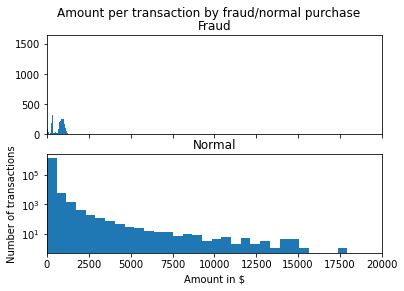

In [ ]:
f, (ax1, ax2) = plt.subplots(2, 1, sharex=True)
f. suptitle("Amount per transaction by fraud/normal purchase")
bins = 50 
ax1.hist(fraud.amt, bins = bins)
ax1.set_title('Fraud')
ax2.hist(normal.amt, bins = bins)
ax2.set_title('Normal')
plt.xlabel("Amount in $")
plt.ylabel('Number of transactions')
plt.xlim((0, 20000))
plt.yscale('log')
plt.show();

*As we can see, the non-fradulent list of purchase amounts has many outliers
---



Categories of Purchase Distributions
---



The different categories that we can check for our model are:<br>
personal_care', 'health_fitness', 'misc_pos', 'travel',
       'kids_pets', 'shopping_pos', 'food_dining', 'home',
       'entertainment', 'shopping_net', 'misc_net', 'grocery_pos',
       'gas_transport', 'grocery_net'

In [ ]:
purchase_categories = fraud_df['category']
purchase_categories.unique()

#Lets transform this back so that we can plot it
fraud_df['is_fraud'].astype(str).astype(object)

#Determine how much of the data is fraud vs normal transactions
fraud_2 = fraud_df[fraud_df['is_fraud'] == 1]
normal_2 = fraud_df[fraud_df['is_fraud'] == 0]

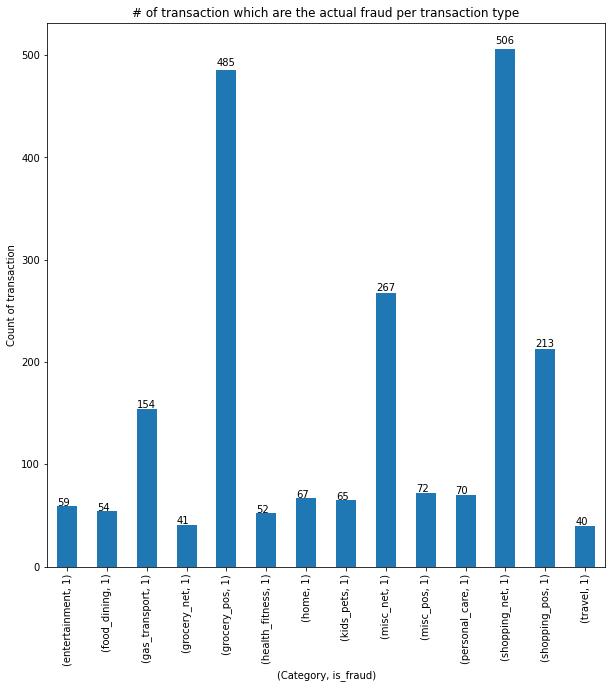

In [ ]:
#This will show us all of the fraudulent transactions in their respective categories

plt.figure(figsize=[10,10])
ax = fraud_2.groupby(['category', 'is_fraud']).size().plot(kind='bar')
ax.set_title("# of transaction which are the actual fraud per transaction type")
ax.set_xlabel("(Category, is_fraud)")
ax.set_ylabel("Count of transaction")
for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()*1.01))

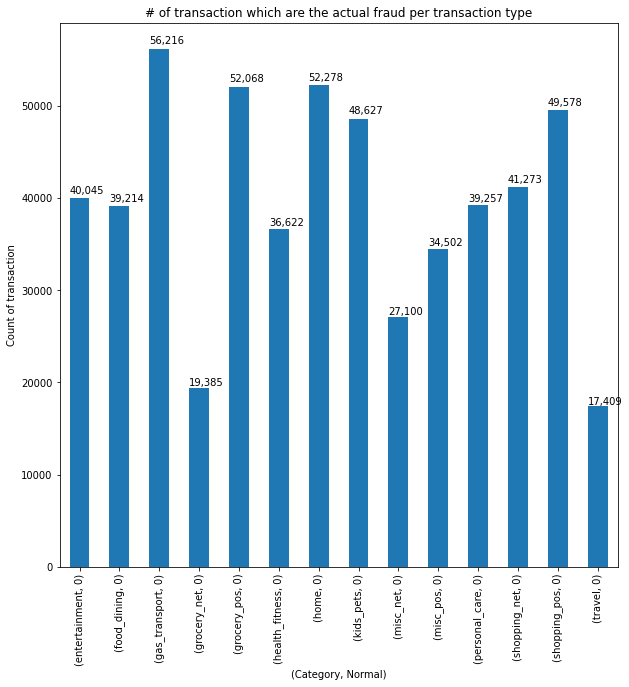

In [ ]:
#This will show us all of the normal transactions in their respective categories

plt.figure(figsize=[10,10])
ax = normal_2.groupby(['category', 'is_fraud']).size().plot(kind='bar')
ax.set_title("# of transaction which are the actual fraud per transaction type")
ax.set_xlabel("(Category, Normal)")
ax.set_ylabel("Count of transaction")
for p in ax.patches:
    ax.annotate(str(format(int(p.get_height()), ',d')), (p.get_x(), p.get_height()*1.01))

In [ ]:
#numerical summary -> only non-anonymized columns of interest
pd.set_option('precision', 3)
fraud_df_train.loc[:, ['unix_time', 'amt']].describe()

,unix_time,amt
count,1296675.00,1296675.00
mean,1349243636.73,70.35
std,12841278.42,160.32
min,1325376018.00,1.00
25%,1338750742.50,9.65
50%,1349249747.00,47.52
75%,1359385375.50,83.14
max,1371816817.00,28948.90


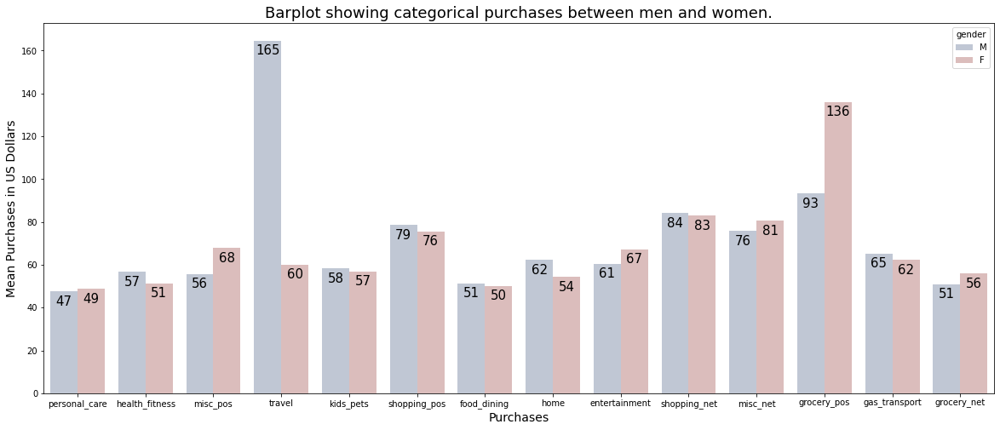

In [ ]:
plt.figure(figsize=(20, 8))
splot=sns.barplot(x="category", y="amt", hue="gender", palette="vlag", ci=None, data=fraud_df)
plt.ylabel("Mean Purchases in US Dollars", size=14)
plt.xlabel("Purchases", size=14)
plt.title("Barplot showing categorical purchases between men and women.", size=18)
for p in splot.patches:
    splot.annotate(format(p.get_height(), '.0f'), 
                   (p.get_x() + p.get_width() / 2., p.get_height()), 
                   ha = 'center', va = 'center', 
                   size=15,
                   xytext = (0, -12), 
                   textcoords = 'offset points')
plt.savefig('Categorical ',dpi=150)

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


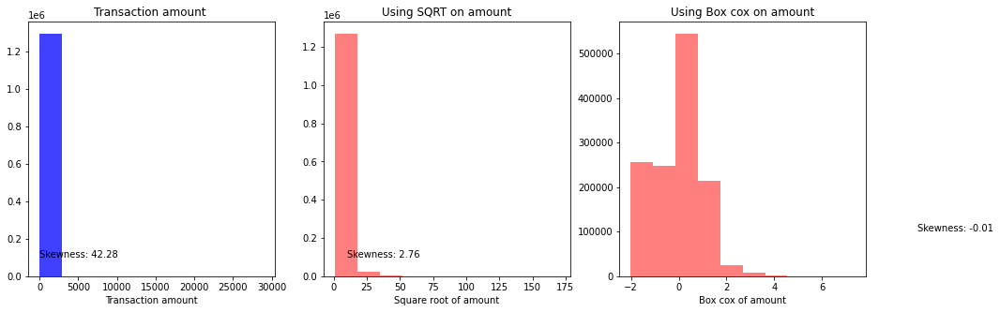

In [ ]:
from statsmodels.tools import categorical
from sklearn import preprocessing
from scipy.stats import skew, boxcox

fraud_df_train['amt_boxcox'] = preprocessing.scale(boxcox(fraud_df_train['amt']+1)[0])
amt_boxcox = fraud_df_train['amt_boxcox'] 

figure = plt.figure(figsize=(16, 5))
figure.add_subplot(131) 
plt.hist(fraud_df_train['amt'] ,facecolor='blue',alpha=0.75) 
plt.xlabel("Transaction amount") 
plt.title("Transaction amount ") 
plt.text(10,100000,"Skewness: {0:.2f}".format(skew(fraud_df_train['amt'])))

figure.add_subplot(132)
plt.hist(np.sqrt(fraud_df_train['amt']), facecolor = 'red', alpha=0.5)
plt.xlabel("Square root of amount")
plt.title("Using SQRT on amount")
plt.text(10, 100000, "Skewness: {0:.2f}".format(skew(np.sqrt(fraud_df_train['amt']))))

figure.add_subplot(133)
plt.hist(fraud_df_train['amt_boxcox'], facecolor = 'red', alpha=0.5)
plt.xlabel("Box cox of amount")
plt.title("Using Box cox on amount")
plt.text(10, 100000, "Skewness: {0:.2f}".format(skew(fraud_df_train['amt_boxcox'])))

plt.show()

In [ ]:

#This will separate the unix time into two years
unix = fraud_df_train['unix_time']
unix_per_year = unix/1296675
unix.describe()
unix_per_year.describe()

count   1296675.00
mean       1040.54
std           9.90
min        1022.13
25%        1032.45
50%        1040.55
75%        1048.36
max        1057.95
Name: unix_time, dtype: float64

/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)




This shows up that the most purchases took place near the 3rd quarter of the fiscal year of 2020.


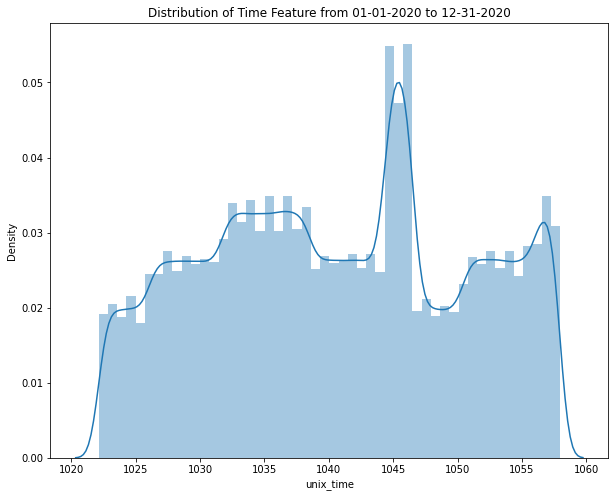

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as md

#visualizations of time and amount
plt.figure(figsize=(10,8))
plt.title('Distribution of Time Feature from 01-01-2020 to 12-31-2020')
sns.distplot(unix_per_year)
print('\n')
print('This shows up that the most purchases took place near the 3rd quarter of the fiscal year of 2020.')

#Find Correlation and Create Dummies

In [ ]:
fraud_df_train.head()

,cc_num,merchant,amt,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud,cat.food_dining,cat.gas_transport,cat.grocery_net,cat.grocery_pos,cat.health_fitness,cat.home,cat.kids_pets,cat.misc_net,cat.misc_pos,cat.personal_care,cat.shopping_net,cat.shopping_pos,cat.travel,is_male.M,date,amt_boxcox
customer_name,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Jennifer Banks,2703186189652095,"Rippin, Kub and Mann",4.97,28654,36.08,-81.18,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.01,-82.05,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1970-01-01 00:00:00.000000000,-1.32
Stephanie Gill,630423337322,"Heller, Gutmann and Zieme",107.23,99160,48.89,-118.21,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.16,-118.19,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1970-01-01 00:00:00.000000001,0.89
Edward Sanchez,38859492057661,Lind-Buckridge,220.11,83252,42.18,-112.26,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.15,-112.15,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1970-01-01 00:00:00.000000002,1.54
Jeremy White,3534093764340240,"Kutch, Hermiston and Farrell",45.00,59632,46.23,-112.11,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.03,-112.56,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1970-01-01 00:00:00.000000003,0.17
Tyler Garcia,375534208663984,Keeling-Crist,41.96,24433,38.42,-79.46,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.67,-78.63,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,1970-01-01 00:00:00.000000004,0.12


['cc_num', 'amt', 'zip', 'lat', 'long', 'city_pop', 'unix_time', 'merch_lat', 'merch_long', 'is_fraud', 'cat.food_dining', 'cat.gas_transport', 'cat.grocery_net', 'cat.grocery_pos', 'cat.health_fitness', 'cat.home', 'cat.kids_pets', 'cat.misc_net', 'cat.misc_pos', 'cat.personal_care', 'cat.shopping_net', 'cat.shopping_pos', 'cat.travel', 'is_male.M', 'amt_boxcox']
**Correlation Matrix (filtered for correlation above 0.25):**


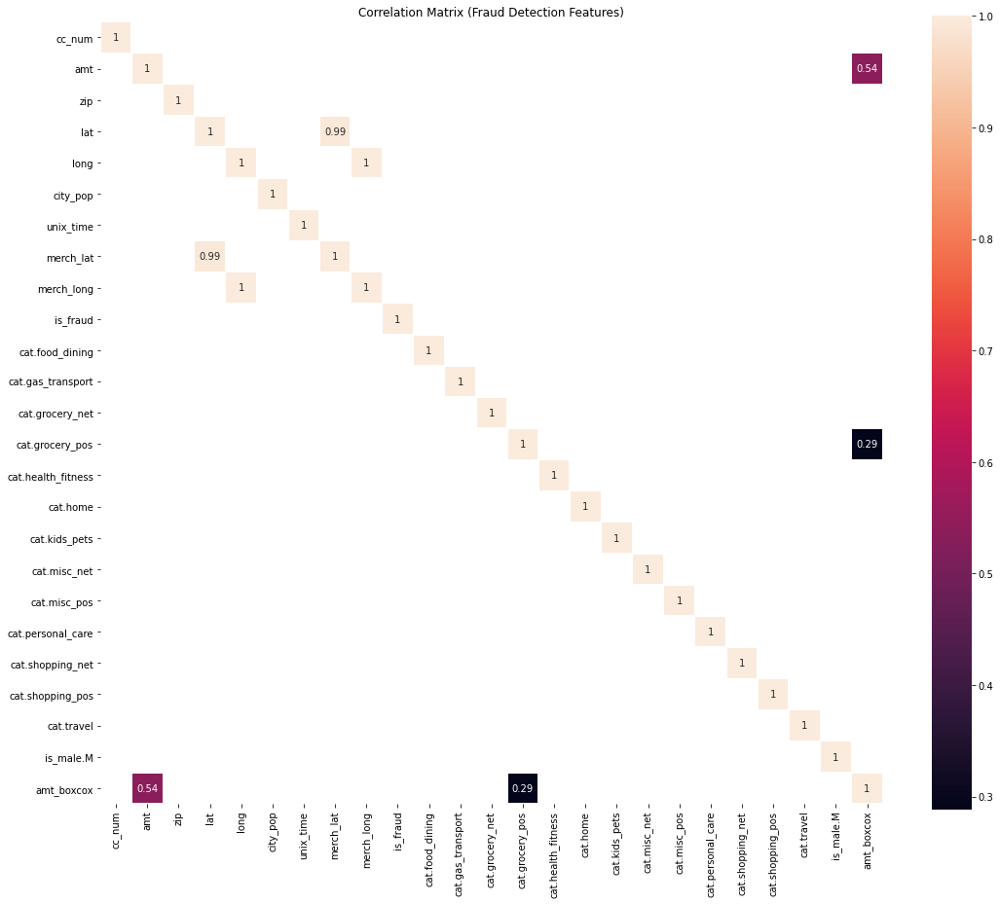

In [ ]:
# correlate life expectancy to all variables:
corr = fraud_df_train.corr()

def draw_heatmap(df,corr_thresh=.25):
    """ Draws heatmap out of a dataframe. 
        Set corr_thresh to -1000 for full heatmap,
        or keep default for strong correlation
    """
    
    # make the correlation matrix.
    corr_mat = df.corr()

    # move the column to head of list using index, pop and insert
    cols = corr_mat.columns.to_list()
    print (cols)

    # reorder
    corr_mat = corr_mat.loc[:, cols]
    corr_mat.sort_values(by=['is_fraud'],ascending=False)

    # figure aesthetics
    plt.figure(figsize=(18,15))
    plt.plot()
    
    # draw the heatmap using seaborn.
    sns.heatmap(corr_mat[(corr_mat > corr_thresh)], square=True, annot=True, linewidths=.5)
    plt.title("Correlation Matrix (Fraud Detection Features)")
    print("**Correlation Matrix (filtered for correlation above {}):**".format(corr_thresh))
    plt.show()

draw_heatmap(fraud_df_train)

Show outliers
---



The score threshold is: 1
The indices of the outliers:
(array([     16,      17,      39, ..., 1289051, 1289097, 1289151]),)
Number of outliers is: 42163
The score threshold is: 2
The indices of the outliers:
(array([    138,     139,     232, ..., 1288722, 1288976, 1289041]),)
Number of outliers is: 19382
The score threshold is: 3
The indices of the outliers:
(array([    138,     232,     296, ..., 1288722, 1288976, 1289041]),)
Number of outliers is: 10185
The score threshold is: 4
The indices of the outliers:
(array([    232,     296,     511, ..., 1288397, 1288508, 1289041]),)
Number of outliers is: 5975




/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)



 Show tukey 



{1.0: [-63.32000000000001, 155.47000000000003, 94772],
 1.5: [-99.78500000000001, 191.935, 62772],
 2.0: [-136.25, 228.40000000000003, 39203],
 2.5: [-172.71500000000003, 264.865, 30075],
 3.0: [-209.18, 301.33000000000004, 25237],
 3.5: [-245.64500000000004, 337.795, 21889],
 4.0: [-282.11, 374.26000000000005, 19460],
 4.5: [-318.57500000000005, 410.7250000000001, 17372],
 5.0: [-355.04, 447.19000000000005, 15445]}

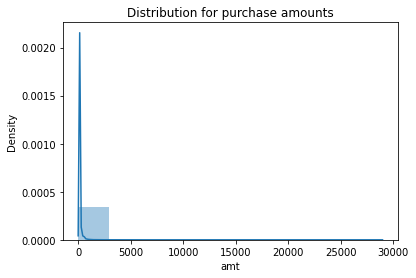

In [ ]:
get_zscore(normal, 'amt')
print('\n')
plt.title('Distribution for purchase amounts')
ax1 = sns.distplot(normal['amt'],bins=10)
print('\n Show tukey \n')
get_tukey(normal, 'amt')

<h2>This shows that the distribution is negatively skewed very strongly, let's take a closer look.</h2>

In [ ]:
#This shows the z score for the fraudulent purchases
get_zscore(normal, 'amt')
print('\n This shows the non-fraudulent purchases.')

The score threshold is: 1
The indices of the outliers:
(array([     16,      17,      39, ..., 1289051, 1289097, 1289151]),)
Number of outliers is: 42163
The score threshold is: 2
The indices of the outliers:
(array([    138,     139,     232, ..., 1288722, 1288976, 1289041]),)
Number of outliers is: 19382
The score threshold is: 3
The indices of the outliers:
(array([    138,     232,     296, ..., 1288722, 1288976, 1289041]),)
Number of outliers is: 10185
The score threshold is: 4
The indices of the outliers:
(array([    232,     296,     511, ..., 1288397, 1288508, 1289041]),)
Number of outliers is: 5975

 This shows the non-fraudulent purchases.


In [ ]:
#This shows the z score for the fraudulent purchases
get_zscore(fraud, 'amt')
print('\n This shows the fraudulent purchases.')

The score threshold is: 1
The indices of the outliers:
(array([  13,   16,   17, ..., 7496, 7501, 7502]),)
Number of outliers is: 1673
The score threshold is: 2
The indices of the outliers:
(array([ 295, 3072, 4777, 7245, 7247, 7274]),)
Number of outliers is: 6
The score threshold is: 3
The indices of the outliers:
(array([], dtype=int64),)
Number of outliers is: 0
The score threshold is: 4
The indices of the outliers:
(array([], dtype=int64),)
Number of outliers is: 0

 This shows the fraudulent purchases.


count   7506.00
mean     531.32
std      390.56
min        1.06
25%      245.66
50%      396.50
75%      900.88
max     1376.04
Name: amt, dtype: float64


Grubbs Calculated Value: 2.1629865642309984
Grubbs Critical Value: 4.50133911239029
From grubbs_test we observe that calculated value is lesser than critical value, Accept null hypothesis and conclude that there is no outliers

None


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


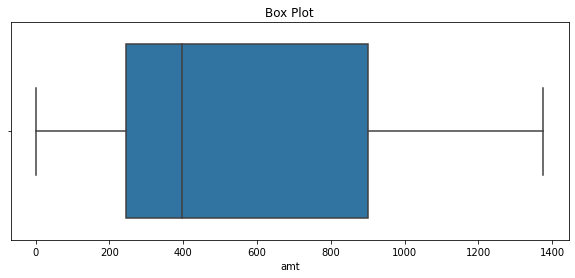

In [ ]:
#This checks if we have outliers in our fraud cases
print(fraud['amt'].describe())
print('\n')
print(grubbs_test(fraud['amt']))

#This prints the distribution of the 'AMT' column
Box_plots(fraud['amt'])

count   1289169.00
mean         67.67
std         154.01
min           1.00
25%           9.61
50%          47.28
75%          82.54
max       28948.90
Name: amt, dtype: float64


Grubbs Calculated Value: 187.53084005508887
Grubbs Critical Value: 5.496266935255039
From grubbs_test we observe that calculated value is greater than critical value, Reject null hypothesis and conclude that there is an outliers

None


/usr/local/lib/python3.6/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


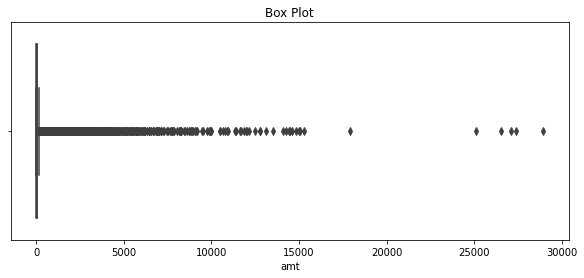

In [ ]:
#This checks if we have outliers in our normal purchases
print(normal['amt'].describe())
print('\n')
print(grubbs_test(normal['amt']))

#This prints the distribution of the 'AMT' column
Box_plots(normal['amt'])

#Scale the features

In [ ]:
fraud_df_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1296675 entries, Jennifer Banks to Jeffrey Smith
Data columns (total 30 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   cc_num              1296675 non-null  int64         
 1   merchant            1296675 non-null  object        
 2   amt                 1296675 non-null  float64       
 3   zip                 1296675 non-null  int64         
 4   lat                 1296675 non-null  float64       
 5   long                1296675 non-null  float64       
 6   city_pop            1296675 non-null  int64         
 7   job                 1296675 non-null  object        
 8   dob                 1296675 non-null  object        
 9   trans_num           1296675 non-null  object        
 10  unix_time           1296675 non-null  int64         
 11  merch_lat           1296675 non-null  float64       
 12  merch_long          1296675 non-null  float64       
 13

In [ ]:
from sklearn import preprocessing
from scipy.stats import skew, boxcox
scaler = StandardScaler()
scaler2 = StandardScaler()

# Normalize amt column
x_amt = np.array(fraud_df_train['amt'])
normalized_amt = preprocessing.normalize(x_amt.reshape(-1, 1))

# This takes only the continuous variables from our dataset.
fraud_train_num = fraud_df_train[fraud_df_train.describe(include=np.number).columns]
fraud_test_num = fraud_df_test[fraud_df_test.describe(include=np.number).columns]

**Scaling hasn't really worked here so we will need to use another method, like normalization with an Interquartile Range.**

#Train/Test Split

In [ ]:
#Manually train/test split non-scaled or randomized using random.rand
train_1 = fraud_train_num.drop(columns=['unix_time', 'merch_lat', 'merch_long', 'lat', 'long', 'unix_time', 'cc_num', 'city_pop', 'zip'])
test_1 = fraud_test_num.drop(columns=['unix_time', 'merch_lat', 'merch_long', 'lat', 'long', 'unix_time', 'cc_num', 'city_pop', 'zip'])
print('Train Shape: {}\nTest Shape: {}'.format(train_1.shape, test_1.shape))

all_data = pd.concat([train_1, test_1])

Train Shape: (1296675, 17)
Test Shape: (555719, 16)


In [ ]:
#How many random samples from normal transactions do we need?
no_of_frauds = all_data.is_fraud.value_counts()[1]
print('There are {} fraudulent transactions in the train data.'.format(no_of_frauds))

There are 9651 fraudulent transactions in the train data.


#Undersampling data to train the model

In [ ]:
#Randomly selecting 9651 random non-fraudulent transactions so as to have plenty of training opportunites for the model
#this is so we can have a standard 80/20 split of across the board of fraud and non-fraud
non_fraud = train_1[train_1['is_fraud'] == 0]
fraud = train_1[train_1['is_fraud'] == 1]

first_mod = non_fraud.sample(no_of_frauds*9) 
len(first_mod)

86859

In [ ]:
#concatenating both into a subsample data set with equal class distribution
subsample = pd.concat([first_mod, fraud, ])
print(len(subsample))


#shuffling our data set
subsample = subsample.sample(frac=1)
subsample.is_fraud.value_counts()

94365


0    86859
1     7506
Name: is_fraud, dtype: int64

In [ ]:
len_after = len(subsample)
len_before = len(all_data)
len_difference = len(all_data) - len(subsample)
print('We reduced our data size from {} transactions by {} transactions to {} transactions for our training data.'.format(len_before, len_difference, len_after))

We reduced our data size from 1852394 transactions by 1758029 transactions to 94365 transactions for our training data.


In [ ]:
corr = subsample.corr()
corr = corr[['is_fraud']]
corr

,is_fraud
amt,0.60
is_fraud,1.00
cat.food_dining,-0.06
cat.gas_transport,-0.02
cat.grocery_net,-0.03
cat.grocery_pos,0.12
cat.health_fitness,-0.05
cat.home,-0.07
cat.kids_pets,-0.05
cat.misc_net,0.09


94365

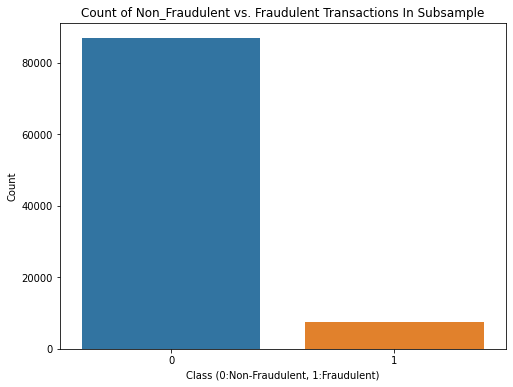

In [ ]:

new_values = subsample.is_fraud.value_counts()
plt.figure(figsize=(8,6))
sns.barplot(x=new_values.index, y=new_values)
plt.title('Count of Non_Fraudulent vs. Fraudulent Transactions In Subsample')
plt.ylabel('Count')
plt.xlabel('Class (0:Non-Fraudulent, 1:Fraudulent)')

len(subsample)

**Calculate the percentiles of a dataset using the percentile, IQR can then be calculated as the difference between the 75th and 25th percentiles.**

0.00       1.00
0.10       4.11
0.20       7.75
0.30      15.74
0.40      32.13
0.50      47.52
0.60      60.94
0.70      75.03
0.80      94.68
0.90     136.67
1.00   28948.90
Name: amt, dtype: float64


/usr/local/lib/python3.6/dist-packages/seaborn/distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


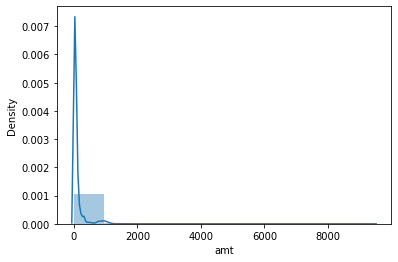

In [ ]:
#Get relevant percentiles and see their distribution
print(fraud_train_num['amt'].quantile([0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]))

#Show the new distribution of the purchase amounts
ax1 = sns.distplot(subsample['amt'],bins=10)#Found normal distribtion of ejection

In [ ]:
# calculate interquartile range
#  q25, q75 = percentile(data, 25), percentile(data, 75)
'''
Q1 = subsample.quantile(0.25)
Q2 = subsample.quantile(0.5)
IQR = Q2 - Q1

df2 = subsample[~((subsample < (Q1) - 1.5 * IQR) |(subsample > (Q2 + 1.5 * IQR))).any(axis=1)]
df2_amt = df2['amt']
'''
df2 = subsample

In [ ]:
# Separate X & Y
X_first_mod = df2.drop('is_fraud', axis=1)
y_first_mod = df2['is_fraud']


X_first_mod.drop(columns='amt_boxcox', inplace=True)

**NOPE, NOT AT ALL!**

#Setup of Training Data

In [ ]:
def warn(*args, **kwargs):
    pass
import warnings
warnings.warn = warn

In [ ]:
# train test split
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X_first_mod, y_first_mod, test_size=0.20, random_state=42)

X_train = X_train.values
X_validation = X_test.values
y_train = y_train.values
y_validation = y_test.values

print('X_shapes:\n', 'X_train:', 'X_validation:\n', X_train.shape, X_validation.shape, '\n')
print('Y_shapes:\n', 'Y_train:', 'Y_validation:\n', y_train.shape, y_validation.shape)

X_shapes:
 X_train: X_validation:
 (75492, 15) (18873, 15) 

Y_shapes:
 Y_train: Y_validation:
 (75492,) (18873,)


##Here is a cheat code to make this next section run faster... <br>
##up, up, down, down, left, X, X, O 

In [ ]:
#Uncomment this out for a faster experience!

#reduce the data to first 20K for faster processing
X_train = X_train[:10000]

#reduce the dataset to first 20K for faster processing
y_train = y_train[:10000]


In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

gbc = ensemble.GradientBoostingClassifier(loss='deviance')
rfc = RandomForestClassifier
##Spot-Checking Algorithms

models = []

models.append(('LR', LogisticRegression()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('CART', DecisionTreeClassifier()))
models.append(('SVM', SVC()))
models.append(('XGB', XGBClassifier()))
models.append(('RF', RandomForestClassifier()))
models.append(('LassoCV', LassoCV()))
models.append(('GradientBoost', GradientBoostingClassifier()))

#testing models
results = []
names = []
for name, model in models:
    kfold = KFold(n_splits=10, random_state=42)
    cv_results = cross_val_score(model, X_train, y_train, cv=kfold, scoring='roc_auc')
    results.append(cv_results)
    names.append(name)
    msg = '%s: %f (%f)' % (name, cv_results.mean(), cv_results.std())
    print(msg)

LR: 0.880941 (0.016292)
KNN: 0.955377 (0.007456)
CART: 0.904417 (0.016613)
SVM: 0.937293 (0.018855)
XGB: 0.982043 (0.009390)
RF: 0.972698 (0.006930)
LassoCV: 0.842636 (0.018441)
GradientBoost: 0.982126 (0.008314)


In [ ]:
#visualizing RF
model = RandomForestClassifier(n_estimators=5)

# Train
model.fit(X_train, y_train)
# Extract single tree
estimator = model.estimators_[3]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                feature_names = X_first_mod.columns.tolist(),
                class_names = ['0',' 1'],
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

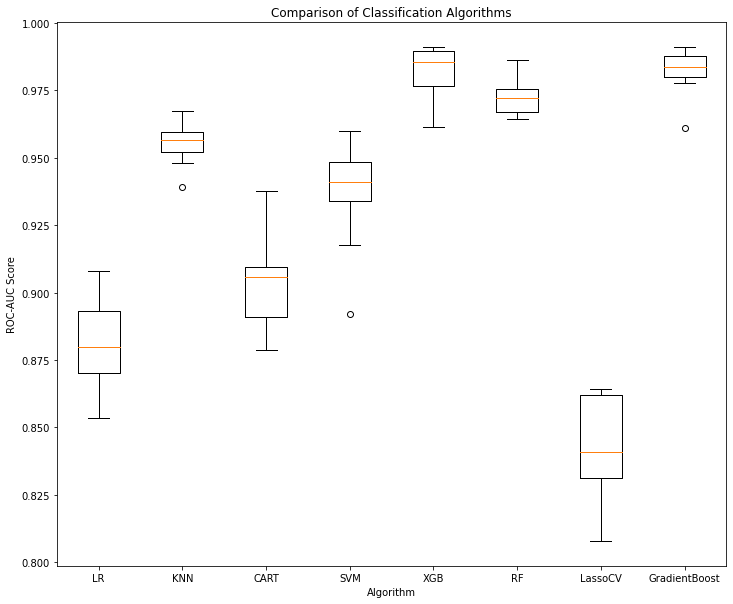

In [ ]:
#Compare Algorithms

fig = plt.figure(figsize=(12,10))
plt.title('Comparison of Classification Algorithms')
plt.xlabel('Algorithm')
plt.ylabel('ROC-AUC Score')
plt.boxplot(results)
ax = fig.add_subplot(111)
ax.set_xticklabels(names)
plt.show()

#Model Output (only showing the top 3)

###Gradient boost model performance






In [ ]:
gbc = ensemble.GradientBoostingClassifier(loss='deviance')
gbc.fit(X_train, y_train.ravel())
y_pred = gbc.predict(X_test)


print("Confusion Matrix: ") 
print(confusion_matrix(y_test, y_pred)) 
print('')

print ("Accuracy : ")
print(accuracy_score(y_test,y_pred)*100) 
print('')

print("Report : ")
print(classification_report(y_test, y_pred))

Confusion Matrix: 
[[17298    67]
 [  289  1219]]

Accuracy : 
98.11370741270599

Report : 
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     17365
           1       0.95      0.81      0.87      1508

    accuracy                           0.98     18873
   macro avg       0.97      0.90      0.93     18873
weighted avg       0.98      0.98      0.98     18873



###XGB Classifier model performance


In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)
clf = XGBClassifier()
clf.fit(X_train,y_train.ravel())
pred = clf.predict_proba(X_test)

print("Confusion Matrix: ") 
print(confusion_matrix(y_test, y_pred)) 
print('')

print ("Accuracy : ")
print(accuracy_score(y_test,y_pred)*100) 
print('')

print("Report : ")
print(classification_report(y_test, y_pred))

Confusion Matrix: 
[[17298    67]
 [  289  1219]]

Accuracy : 
98.11370741270599

Report : 
              precision    recall  f1-score   support

           0       0.98      1.00      0.99     17365
           1       0.95      0.81      0.87      1508

    accuracy                           0.98     18873
   macro avg       0.97      0.90      0.93     18873
weighted avg       0.98      0.98      0.98     18873



###Random Forest model performance


In [ ]:
rf = RandomForestClassifier(max_depth=2, random_state=0)
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)


print("Confusion Matrix: ") 
print(confusion_matrix(y_test, y_pred)) 
print('')

print ("Accuracy : ")
print(accuracy_score(y_test,y_pred)*100) 
print('')

print("Report : ")
print(classification_report(y_test, y_pred))

Confusion Matrix: 
[[17365     0]
 [ 1508     0]]

Accuracy : 
92.00974937741748

Report : 
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     17365
           1       0.00      0.00      0.00      1508

    accuracy                           0.92     18873
   macro avg       0.46      0.50      0.48     18873
weighted avg       0.85      0.92      0.88     18873



##Hyper-Parameter tuning with RandomsearchCV

In [ ]:
from sklearn.model_selection import RandomizedSearchCV
# a list that contains algorithms and key hyperparameters
search_space = [
                {RandomForestClassifier():{"n_estimators": [10, 100, 1000],
                 "max_depth":[5,8,15,25,30,None],
                 "min_samples_leaf":[1,2,5,10,15,100],
                 "max_leaf_nodes": [2, 5,10]}},
                {DecisionTreeClassifier():{"criterion":['gini','entropy'],
                 "splitter":['best','random'],
                 "min_samples_split":[2,5,15,50],
                 "max_features":["sqrt",'log2','auto'],
                 "presort":[True,False]}},
                {KNeighborsClassifier():{
                 "n_neighbors": [2,3,5],
                 "weights": ['uniform','distance'],
                 "algorithm": ['ball_tree','kd_tree','brute'],
                 "leaf_size": [2,3,10],
                 "p": [1,2],
                 "n_jobs": [-1]}},    
                {LinearSVC():{"dual": [True,False],
                 "tol": [1e-4, 1e-2, 1e-1],
                 "C": [1,0.6,0.4,0.1],
                 "fit_intercept": [True,False],
                 "max_iter": [300,500,1000,10000]}},
                {LinearRegression():{"fit_intercept":[True,False],
                 "normalize":[True,False]}}
]

# list containing only algorithms
estimators = []
for i in range(len(search_space)):
    estimators += search_space[i].keys()

# list containing only hyperparameters
params = []
for i in range(len(search_space)):
    params += search_space[i].values()

# create a gridsearch of each algorithm and its hyperparameters, the fit the best model
for i in range(len(estimators)):
    randomsearch = RandomizedSearchCV(estimators[i], params[i], cv=5, verbose=0,n_jobs=-1) # Fit grid search
    best_model = randomsearch.fit(X_train, y_train)
    print(best_model.best_estimator_)
    print("The mean accuracy of the model is:",best_model.score(X_test, y_test),'\n')
    del randomsearch

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=5, max_features='auto',
                       max_leaf_nodes=10, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=5, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=1000,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
The mean accuracy of the model is: 0.9735071265829491 

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features='log2', max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=5,
                       min_weight_fraction_leaf=0.0, presort=True,
                       random_state=

#Build a final model

In [ ]:
rfc = ensemble.RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=25, max_features='auto',
                       max_leaf_nodes=10, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
cross_val_score(rfc, X_train, y_train, cv=10)

array([0.98 , 0.973, 0.98 , 0.97 , 0.978, 0.975, 0.975, 0.974, 0.97 ,
       0.973])

In [ ]:
X_train.shape

(10000, 15)

In [ ]:
y_train.shape

(10000,)

#GridsearchCV was taking over an hour to run so I'm going to limit the shape to the first 20K instances

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.calibration import CalibratedClassifierCV

#What works best?
rfc_params = {'n_estimators': np.arange(50,500,50),
              'criterion': ['gini', 'entropy'],
              'max_depth': [3,4,5],
              }
gs_rfc = GridSearchCV(rfc,rfc_params,cv=10)
gs_rfc.fit(X_train, y=y_train)

print(gs_rfc.best_params_)

gs_rfc.best_score_

{'criterion': 'entropy', 'max_depth': 5, 'n_estimators': 300}


0.9751000000000001

##The best parameters GridSearch found:

{'criterion': 'entropy', 'max_depth': 5 , 'n_estimators': 300 }

#Random Forest after Hyperparameter tuning

In [ ]:
rfc_best = RandomForestClassifier(n_estimators=300, criterion='entropy', max_depth=5, random_state= 0)
rfc_best.fit(X_train,y_train)

Y_pred_1 = rfc_best.predict(X_test)
Y_pred_1 

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
Y_pred_1.shape

(18873,)

In [ ]:
X_test.shape

(18873, 15)

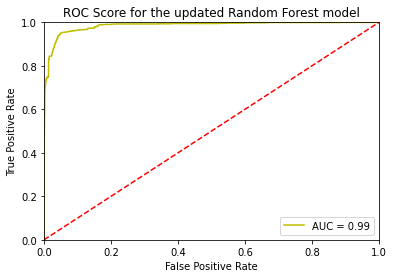

In [ ]:
from sklearn.metrics import roc_curve, auc

#Plot the AUC_ROC score for the Random Forest Model
probs = rfc_best.predict_proba(X_test)
malignant_probs = probs[:,1]
fpr, tpr, thresholds = roc_curve(y_test, malignant_probs)
roc_auc = auc(fpr, tpr)

plt.title('ROC Score for the updated Random Forest model')
plt.plot(fpr, tpr, 'y', label = 'AUC = %0.2f' % roc_auc)
plt.legend(loc = 'lower right')
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.show()

In [ ]:
cross_val_score(rfc_best, X_test, y_test, cv=10)

array([0.97669492, 0.96875   , 0.96769068, 0.97721251, 0.97774245,
       0.97880233, 0.97403286, 0.97297297, 0.97403286, 0.97085321])

In [ ]:
rfc_best.score(X_test, y_test)

0.9736660838234515

In [ ]:
print("Confusion Matrix: ") 
print(confusion_matrix(y_test, Y_pred_1)) 
print('')

print ("Accuracy : ")
print(accuracy_score(y_test,Y_pred_1)*100) 
print('')

print("Report : ")
print(classification_report(y_test, Y_pred_1))

Confusion Matrix: 
[[17312    53]
 [  444  1064]]

Accuracy : 
97.36660838234515

Report : 
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     17365
           1       0.95      0.71      0.81      1508

    accuracy                           0.97     18873
   macro avg       0.96      0.85      0.90     18873
weighted avg       0.97      0.97      0.97     18873



#Gradient boost on test data

In [ ]:
#What works best?
gbc_params = {'n_estimators':  np.arange(100,600,100),
              }
gs_gbc = GridSearchCV(gbc, gbc_params, cv=10)
gs_gbc.fit(X_train, y=y_train)

print(gs_rfc.best_params_)

gs_rfc.best_score_

In [ ]:
import xgboost as xgb

In [ ]:

xgb_best = xgb.XGBClassifier()

#brute force scan for all parameters, here are the tricks
#usually max_depth is 6,7,8
#learning rate is around 0.05, but small changes may make big diff
#tuning min_child_weight subsample colsample_bytree can have 
#much fun of fighting against overfit 
#n_estimators is how many round of boosting
#finally, ensemble xgboost with multiple seeds may reduce variance
xgb_params = {'nthread':[4], #when use hyperthread, xgboost may become slower
              'objective':['binary:logistic'],
              'learning_rate': [0.05], #so called `eta` value
              'max_depth': [6],
              'min_child_weight': [11],
              'silent': [1],
              'subsample': [0.8],
              'colsample_bytree': [0.7],
              'n_estimators': [5], #number of trees, change it to 1000 for better results
              'missing':[-999],
              'seed': [1337]}

xgb_best = GridSearchCV(xgb_best, xgb_params, cv=10)
xgb_best.fit(X_train, y=y_train)

print(xgb_best.best_params_)

xgb_best.best_score_

{'colsample_bytree': 0.7, 'learning_rate': 0.05, 'max_depth': 6, 'min_child_weight': 11, 'missing': -999, 'n_estimators': 5, 'nthread': 4, 'objective': 'binary:logistic', 'seed': 1337, 'silent': 1, 'subsample': 0.8}


0.9456

In [ ]:
xgb_best = ensemble.GradientBoostingClassifier(loss='exponential', subsample=0.7, learning_rate=.05,  n_estimators=5, max_depth=6)
xgb_best.fit(X_train,y_train)

Y_pred_2 = xgb_best.predict(X_test)
Y_pred_2

print(Y_pred_2.shape)

(18873,)


In [ ]:
#Run a Kfold analysis
kfold = KFold(n_splits=10, random_state=7)
results = cross_val_score(xgb_best, X_test, y_test, cv=kfold)
print("Accuracy: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Accuracy: 92.01% (0.73%)


In [ ]:
from sklearn.metrics import accuracy_score,roc_auc_score

print("auc roc score: ", roc_auc_score(y_test, Y_pred_2))

auc roc score:  0.5


In [ ]:
cross_val_score(xgb_best, X_test, y_test, cv=10)

array([0.92002119, 0.92002119, 0.92002119, 0.92050874, 0.92050874,
       0.9199788 , 0.9199788 , 0.9199788 , 0.9199788 , 0.9199788 ])

In [ ]:
print("Confusion Matrix: ") 
print(confusion_matrix(y_test, Y_pred_2)) 
print('')

print ("Accuracy : ")
print(accuracy_score(y_test,Y_pred_2)*100) 
print('')

print("Report : ")
print(classification_report(y_test, Y_pred_2))

Confusion Matrix: 
[[17365     0]
 [ 1508     0]]

Accuracy : 
92.00974937741748

Report : 
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     17365
           1       0.00      0.00      0.00      1508

    accuracy                           0.92     18873
   macro avg       0.46      0.50      0.48     18873
weighted avg       0.85      0.92      0.88     18873



<h2>*Fraud* is a very difficult to detect in a dataset where only 1-1.3% of the industry standard indicates fraudulent purchases lie.  
This was definitely lots of trial and error, and in the real world, would need to include back propagation neural networks in order to detect outliers more efficiently. However, the Random Forest and Gradientboost seemed to be the best.<br><br> It would appear as though my model training was very inaccurate as my data is overfit. Although in this particular type of predictive modeling, it's actually good to error on the side of caution since it's better to set front end check-ins with the client side to confirm if the purchase was fraudulent or not. *This model needs to be made more robust in order to account for the fact that this is a very unbalanced type of dataset due to the nature of how fraud detection is. It would need to include stacking, meta-classifiers and anomaly detection.*  <br><br> However in all fairness to this model, even the leading quantitative researches at MIT have created fraud detection model called "Deep Feature Sythesis" that has an average **0.41** precision score. That means of all the fraud that occurs in a given dataset, which again hovers between *1-1.3%*, so still it's missing have of the rest of cases.<br> <br>
Future work will include account protection of personal privacy data by using BHashing and Salting in order to encrypt sensitive account information and export those columns to triple level cell servers with double blind encryption. Unlike normal hashing functions which are one-way encryption, with B-Hashing the data can be encrypted and decoded with a password manager in the server side.<br></h2>
<br>
As you could tell, this was done by measuring the ROC-AUC Score

**These are for predictions.**
*   LR: 0.522549 (0.040802)
*   KNN: 0.559273 (0.049759)
*   CART: 0.915456 (0.021279)
*   SVM: 0.513533 (0.037054)
*   XGB: 0.976198 (0.013834)
*   RF: 0.982476 (0.009486)
*   LassoCV: 0.522521 (0.040837)
*   GradientBoost: 0.976198 (0.011946)

**The test scores for the Random Forest are:**

In [ ]:
# THERE IS NO CODE IN THIS CELL, FOR DISPLAY ONLY

Confusion Matrix: 
[[17312    53]
 [  444  1064]]

Accuracy : 
97.36660838234515

Report : 
              precision    recall  f1-score   support

           0       0.97      1.00      0.99     17365
           1       0.95      0.71      0.81      1508

    accuracy                           0.97     18873
   macro avg       0.96      0.85      0.90     18873
weighted avg       0.97      0.97      0.97     18873

**The test scores for the XGBoost Classifier are:**

In [ ]:
# THERE IS NO CODE IN THIS CELL, FOR DISPLAY ONLY

Confusion Matrix: 
[[17365     0]
 [ 1508     0]]

Accuracy : 
92.00974937741748

Report : 
              precision    recall  f1-score   support

           0       0.92      1.00      0.96     17365
           1       0.00      0.00      0.00      1508

    accuracy                           0.92     18873
   macro avg       0.46      0.50      0.48     18873
weighted avg       0.85      0.92      0.88     18873
